## Implementation and application of the Mixture of Gaussians (MoG) model



#### Installing Necessary Libraries

In [184]:
!pip install numpy
!pip install matplotlib
!pip install scipy scikit-learn 
!pip install pandas 

In [163]:
import os
import numpy as np
import scipy
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline

For this lab, we will use the Peterson and Barney’s dataset of vowel formant frequencies. (For more info, look at Classification of Peterson & Barney’s vowels using Weka. - a copy of this article is on QMplus)

More specifically, Peterson and Barney measured the fundamental frequency $F0$ and the first three formant frequencies ($F1-F3$) of sustained English Vowels, using samples from various speakers.

Upload the .npy file and load it using the code block below.

In [164]:
#from google.colab import files
#files.upload()
data_npy_file = 'PB_data.npy'

# Loading data from .npy file
data = np.load(data_npy_file, allow_pickle=True)

In [165]:
data

array({'f3': array([2850, 2790, 2640, ..., 3380, 2160, 2200], dtype=uint16), 'f2': array([2280, 2400, 2030, ..., 1140, 1850, 1830], dtype=uint16), 'f1': array([240, 280, 390, ..., 500, 740, 660], dtype=uint16), 'f0': array([160, 186, 203, ..., 334, 308, 328], dtype=uint16), 'phoneme_id': array([ 1,  1,  2, ...,  9, 10, 10], dtype=uint8)},
      dtype=object)

The dataset contains 4 vectors ($F0-F3$), containing the fundamental frequencies ($F0$, $F1$, $F2$ and $F3$) for each phoneme and another vector “phoneme\_id” containing a number representing the id of the phoneme.

In the exercises that follow, we will use only the dataset associated with formants $F1$ and $F2$.

**Note**: Phonemes and Frequencies are two different things; phoneme_id is the ground truth class of each row while frequencies represent features of each data point. Please review the papers provided with the lab materials for more details.

In [166]:
data = np.ndarray.tolist(data)
# Array that contains the phoneme ID (1-10) of each sample
phoneme_id = data['phoneme_id']

# frequencies f1 and f2
f1 = data['f1']
f2 = data['f2']

#### Plotting F1 and F2 for Phoneme 1

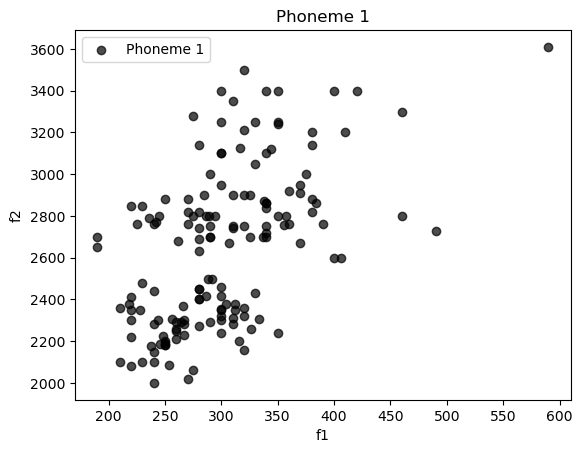

In [167]:
# Create array containing only samples that belong to phoneme 1
X_phoneme_1 = np.zeros((np.sum(phoneme_id == 1), 2))
j = 0
for i in range(len(phoneme_id)):
    if phoneme_id[i] == 1:
        X_phoneme_1[j, 0] = f1[i]
        X_phoneme_1[j, 1] = f2[i]
        j = j + 1

#Create a figure and a subplot
fig, ax2 = plt.subplots()
title_string = 'Phoneme 1'

#Plotting
ax2.scatter(X_phoneme_1[:, 0], X_phoneme_1[:, 1], color = 'black', alpha=0.7, label = 'Phoneme 1')
ax2.set_title(title_string)
ax2.set_xlabel('f1')
ax2.set_ylabel('f2')
ax2.legend()
# Show the plot
plt.show()

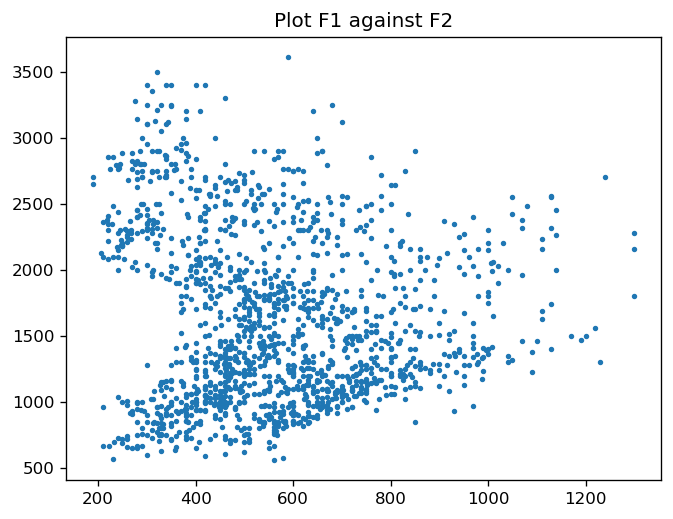

In [168]:
#Plotting F1 against F2
plt.figure(dpi=120)
plt.scatter(f1, f2, s=5)
plt.title("Plot F1 against F2")
plt.show()

#### Plotting F1 against F2

/tmp/ipykernel_1587/1480939599.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(f1[class_indices], f2[class_indices], alpha=0.7, label=f'Phoneme {phoneme_class}', cmap = 'magma')


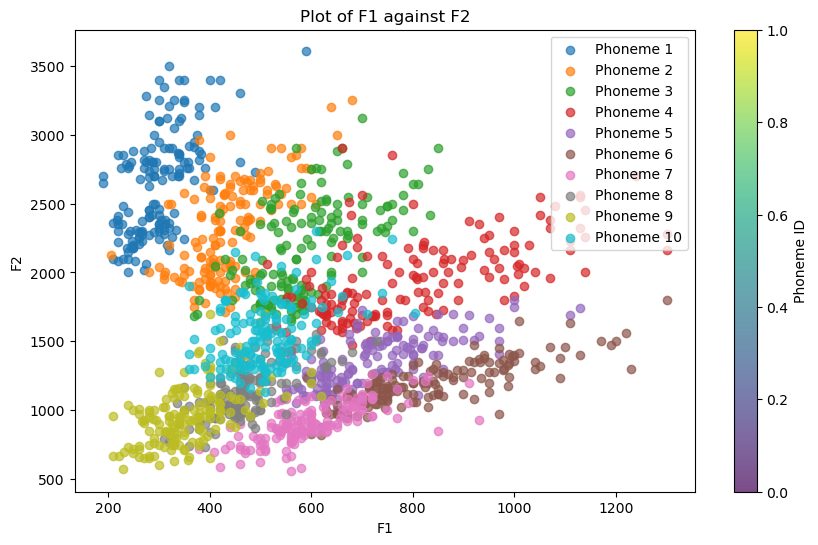

In [169]:
# Get unique phoneme_id values
unique_phoneme_ids = np.unique(phoneme_id)

# Create a figure
plt.figure(figsize=(10, 6))

# Plot each class with a separate legend entry
for phoneme_class in unique_phoneme_ids:
    class_indices = np.where(phoneme_id == phoneme_class)[0]
    plt.scatter(f1[class_indices], f2[class_indices], alpha=0.7, label=f'Phoneme {phoneme_class}', cmap = 'magma')

# Set title and labels
plt.title('Plot of F1 against F2')
plt.xlabel('F1')
plt.ylabel('F2')

# Add colorbar
plt.colorbar(label='Phoneme ID')

# Display the legend
plt.legend()

plt.show()


# 1. MoG Using the EM algorithm

Recall the following definition of a Mixture of Gaussians. Assuming our observed random vector is $\mathbf{x}\in\mathbb{R}^D$, a MoG models $p(\mathbf{x})$ as a sum of $K$-many weighted Gaussians. More specifically:


\begin{equation}
 p(\mathbf{x}) = \sum_{k=1}^K \frac{p(c_{k})}{(2\pi)^{D/2} \mathrm{det}\left(\boldsymbol\Sigma_k\right)^{1/2}}
 % \exp(-\frac{1}{2}(x-\mu)^T \sum_{k}^{-1}(x-\mu))
 \exp\left(-\frac{1}{2}(\mathbf{x}-\boldsymbol\mu_k)^\top {\boldsymbol\Sigma_k}^{-1}(\mathbf{x}-\boldsymbol\mu_k)\right),
\end{equation}
where:
* $\boldsymbol\mu_k\in\mathbb{R}^{D}$
* $\boldsymbol\Sigma_{k}\in\mathbb{R}^{D\times D}$
* $p(c_{k})=\pi_k\in\mathbb{R}$

denote the $k$-th gaussian component's **mean vector**, **covariance matrix**, and **mixture coefficients** respectively. The $K$-many gaussian components' model parameters are referred to collectively as $\theta = \{\boldsymbol\mu_k,\boldsymbol\Sigma_{k},\pi_k\}_{k=1}^K$.

## EM Algorithm
For the E step we softly assign each datum to the closest centroid (using the current iteration's fixed model parameters) as in the K means example.

For the M step we update the model parameters $\theta$ to maximize the weighted log-likelihood.
At a high level, for each centroid k we:
* Update the mean vectors
* Update the covariance matrices (We will fit Gaussians with diagonal covariance matrices)
* Set the mixture coefficients as the mean probability of a sample being generated by the k-th gaussian component

Read the code below and understand what it is calculating

In [170]:
#Calculates PDF of a dataset given Gaussian Mixture Models(GMM)
def get_predictions(mu, s, p, X):
	"""
		:param mu			: means of GMM components
		:param s			: covariances of GMM components
		:param p 			: weights of GMM components
		:param X			: 2D array of our dataset
		mu_i: Extracts the mean vector of the current GMM component.
		mu_i: Reshapes the mean vector to be a column vector.
		mu_i_repeated: Repeats the column vector to create a matrix with dimensions (N, D).
		X_minus_mu: Computes the difference between the dataset and the mean of the current GMM component.
	"""

	# get number of GMM components
	k = s.shape[0]
	# get number of data samples
	N = X.shape[0]
	# get dimensionality of our dataset
	D = X.shape[1]

	Z = np.zeros((N, k))
	for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))# Calculate the probability density function (PDF) for each sample and component.
	return Z


### Helper functions

In [171]:
#Visualize Gaussians in 2D/3D space
def plot_gaussians(ax, s, mu, X, title_string):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    ax.clear()
    if X.shape[1] == 2:
        # set label of horizontal axis
        ax.set_xlabel('f1')
        # set label of vertical axis
        ax.set_ylabel('f2')
        # scatter the points, with red color
        ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)

    k = s.shape[0]
    color_list = ['r', 'g', 'b', 'c', 'm', 'y']
    N_sides = 11

    # Iterate over all gaussians
    for k_cnt in range(k):

        # pick the covariance matrix and mean values of each gaussian
        s_k = s[k_cnt]
        mu_k = mu[k_cnt]

        if s_k.shape[0]==2:
            # dataset with 2 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*2*np.pi
            matrix = np.array([np.cos(theta), np.sin(theta)])
            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), matrix) + mu_repeated
            plt.plot(epoints[0,:], epoints[1,:], color=color_list[k_cnt], linewidth=2)
            plt.scatter(mu_k[0], mu_k[1], color=color_list[k_cnt], marker='o', linewidth=2)
        elif s_k.shape[0]==3:
            # dataset with 3 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*np.pi
            phi = side_range/(N_sides-1)*2*np.pi
            sin_theta = np.expand_dims(np.sin(theta), axis=1)
            cos_theta = np.expand_dims(np.cos(theta), axis=1)
            sin_phi = np.expand_dims(np.sin(phi), axis=1)
            cos_phi = np.expand_dims(np.cos(phi), axis=1)
            sx = np.matmul(sin_theta, cos_phi.transpose())
            sy = np.matmul(sin_theta, sin_phi.transpose())
            sz = np.matmul(cos_theta, np.ones((1, N_sides)))
            svect = np.array([sx.reshape((N_sides*N_sides)), sy.reshape((N_sides*N_sides)), sz.reshape((N_sides*N_sides))])

            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides*N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), svect) + mu_repeated

            ex = epoints[0]
            ey = epoints[1]
            ez = epoints[2]

            ax.plot3D(epoints[0,:], epoints[1,:], epoints[2,:], color=color_list[k_cnt])
            ax.plot3D(ex, ey, ez, color=color_list[k_cnt])
        else:
            print('Each dataset sample should have either 2 or 3 features. Not plotting this one.')
    ax.legend()
    display.clear_output(wait=True)
    display.display(plt.gcf())

#Visualize dataset in 3D
def plot_data_3D(X, title_string, ax):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    # clear subplot from previous (if any) drawn stuff
    ax.clear()
    # set label of x axis
    ax.set_xlabel('f1')
    # set label of y axis
    ax.set_ylabel('f2')
    # set label of z axis
    ax.set_zlabel('f1 + f2')
    # scatter the points, with red color
    ax.scatter3D(X[:,0], X[:,1], X[:,2], c='black', marker='.', label=title_string)
    # add legend to the subplot
    ax.legend()


def save_model(mu, s, p):
  GMM_parameters = {}
  GMM_parameters['mu'] = mu
  GMM_parameters['s'] = s
  GMM_parameters['p'] = p
  if not os.path.isdir('data/'):
    os.mkdir('data/')
  npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
  np.save(npy_filename, GMM_parameters)

## Train MoG

Read the following blocks of code and understand what it does.

In [172]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

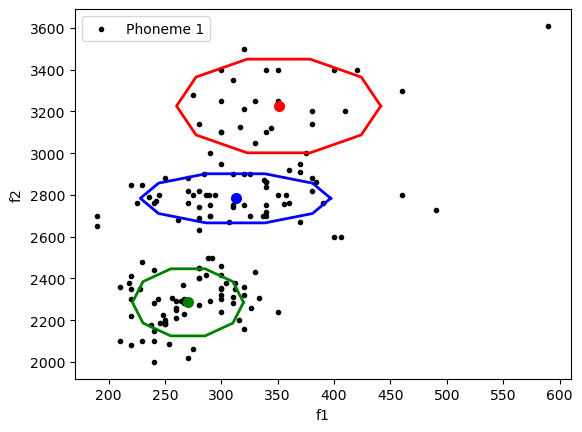


Finished.

[[ 350.8446  3226.3394 ]
 [ 270.3952  2285.4653 ]
 [ 312.59125 2783.898  ]] [[[ 4102.875375       0.        ]
  [    0.         27829.5422143 ]]

 [[ 1213.73843494     0.        ]
  [    0.         14278.4202995 ]]

 [[ 3562.59743765     0.        ]
  [    0.          7657.84897245]]]


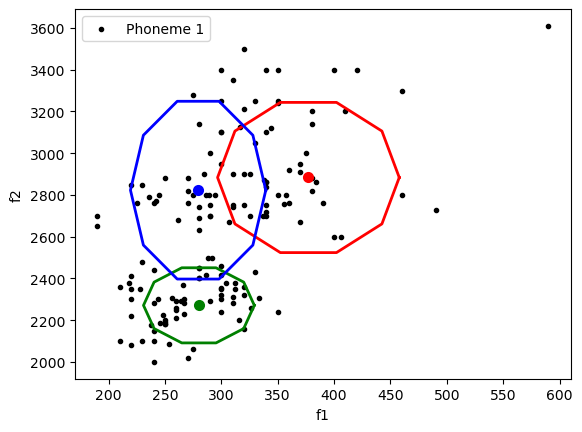

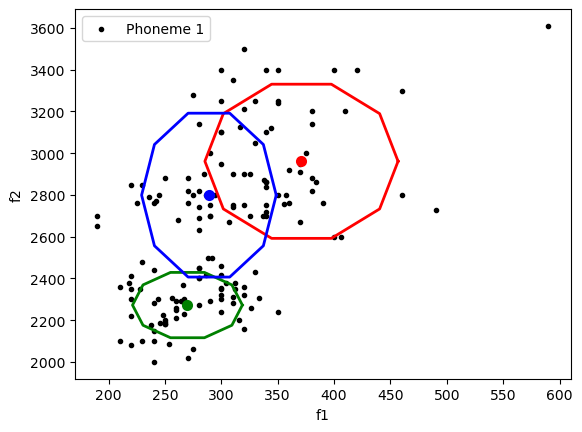

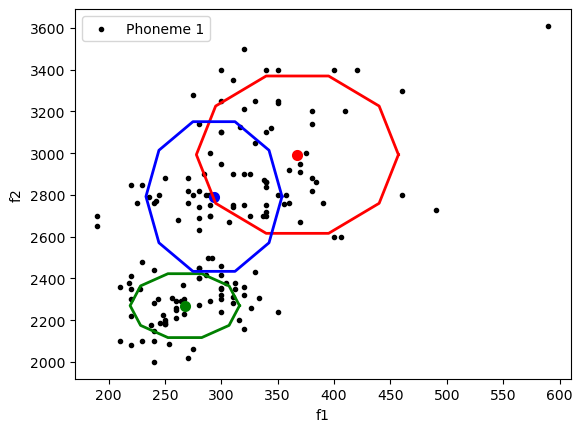

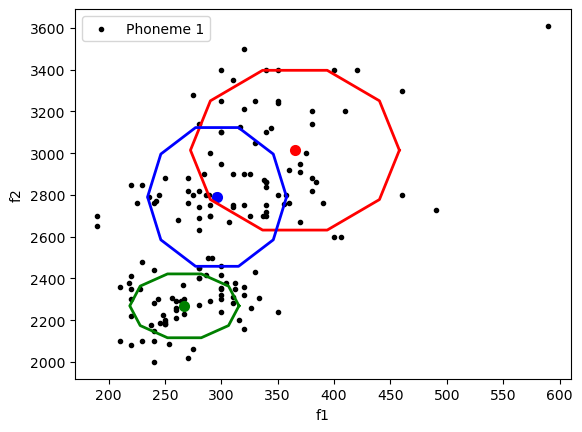

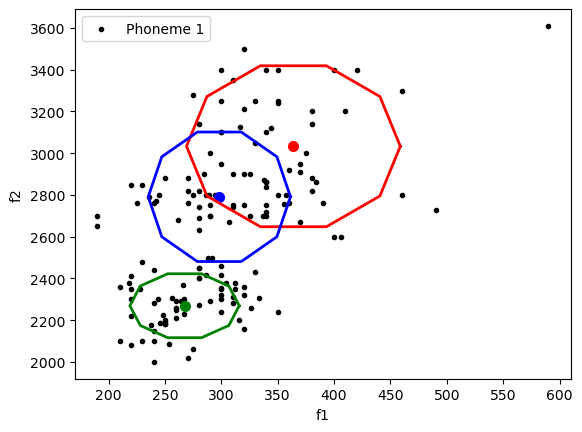

...

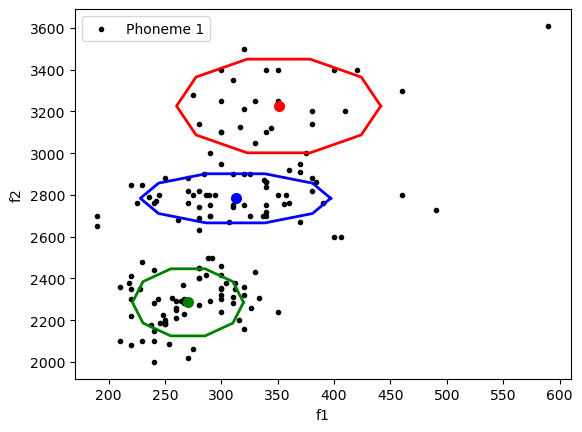

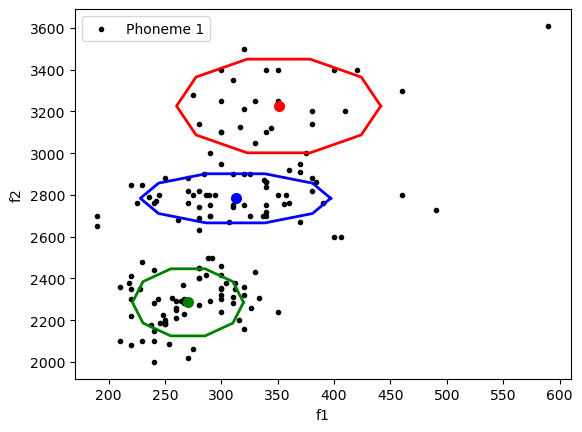

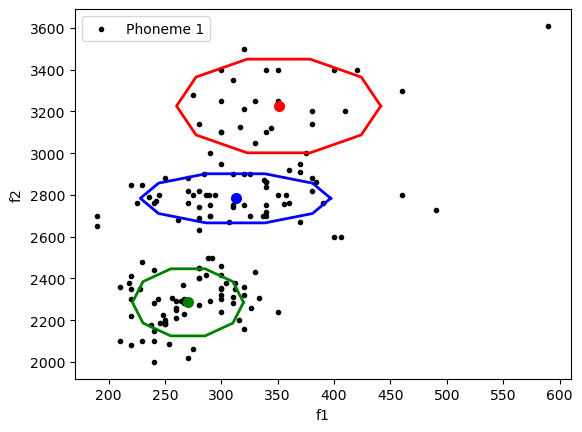

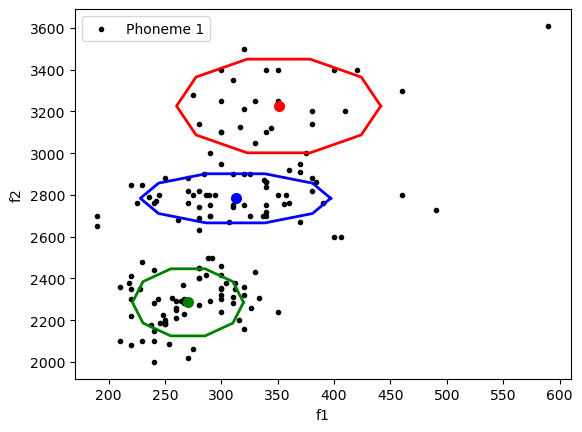

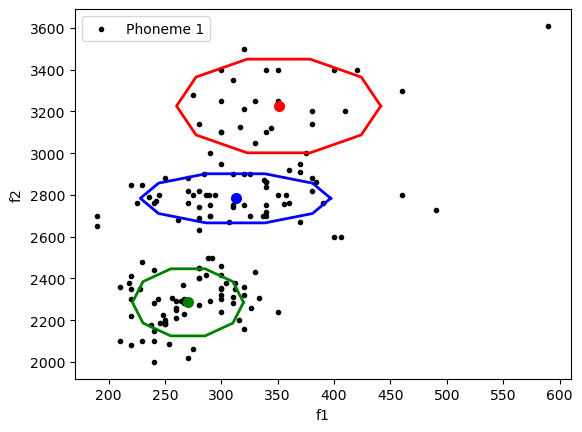

In [173]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

### <font color="maroon"> Run the code multiple times for $K=3$, and observing changes. Use figures and the printed MoG parameters to support your arguments </font>
###  Repeat the training for phoneme_id = 2  and save the parameters 
###  Repeat training for $K=6$ for phoneme_id =1 and phoneme_id=2 and save the model parameters 

Save your MoG model: this should comprise the variables mu, s and p. Include the all the saved model parameters in the submission .zip folder.

###  Q3. Answer

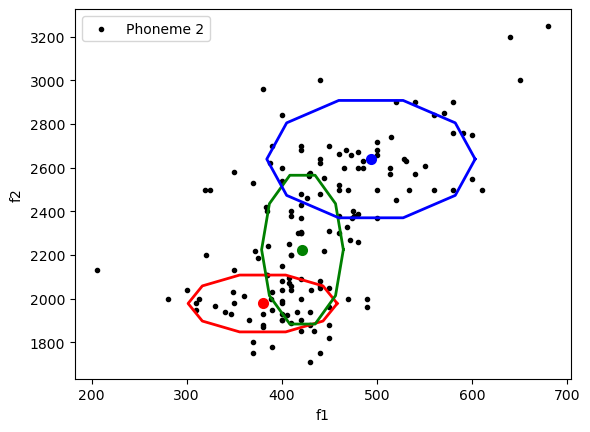


Finished.

[[ 379.7974 1977.8567]
 [ 421.6542 2224.5579]
 [ 493.6506 2639.519 ]] [[[ 3072.6368933      0.        ]
  [    0.          9383.48855318]]

 [[  922.9437073      0.        ]
  [    0.         64275.2849341 ]]

 [[ 5997.58979319     0.        ]
  [    0.         39985.26140793]]]


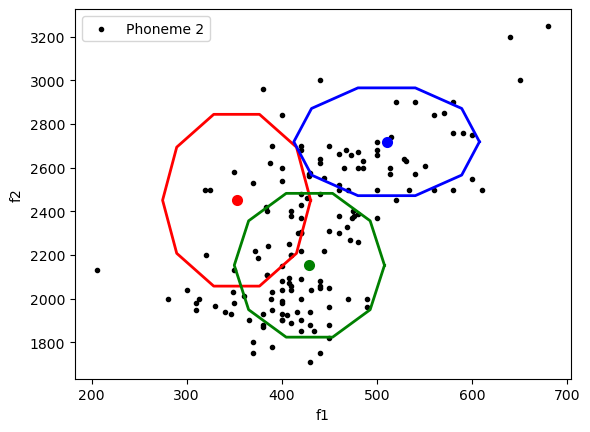

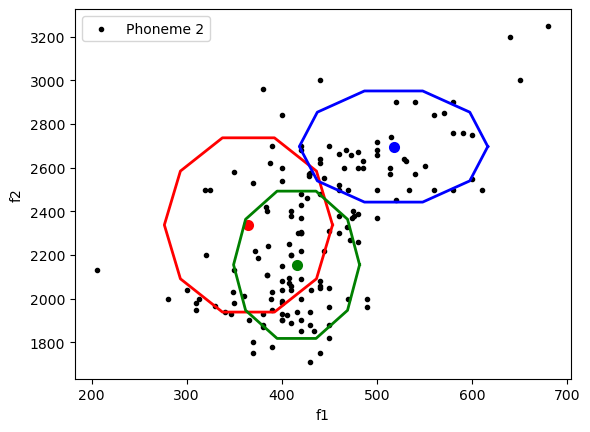

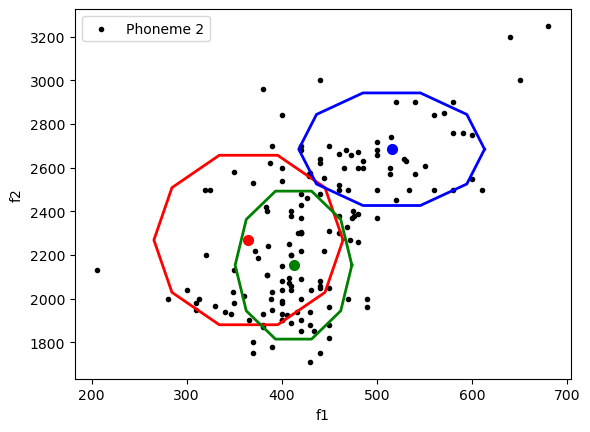

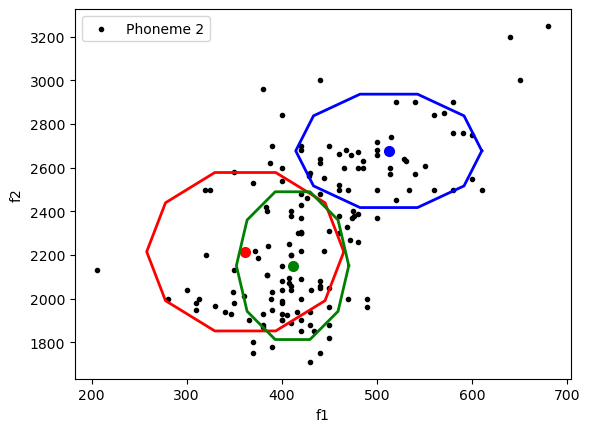

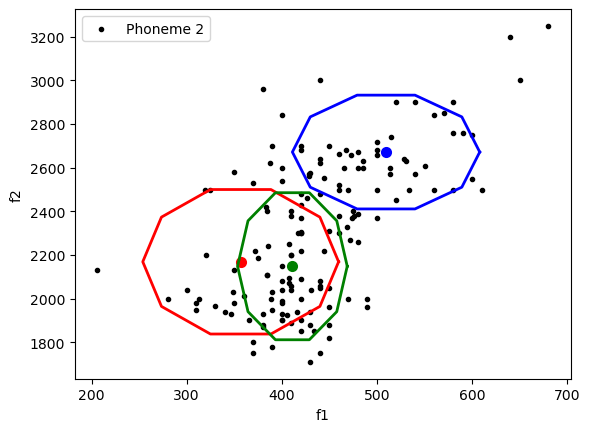

...

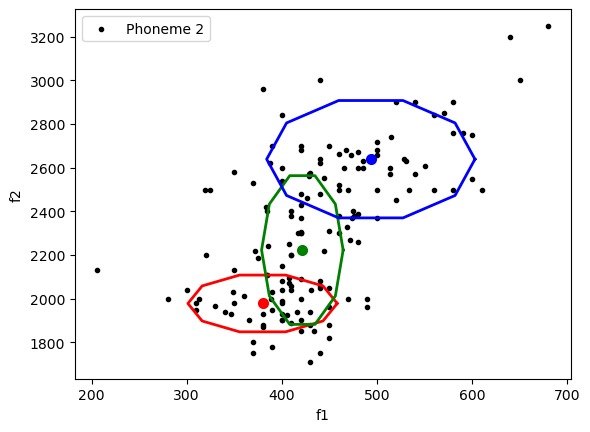

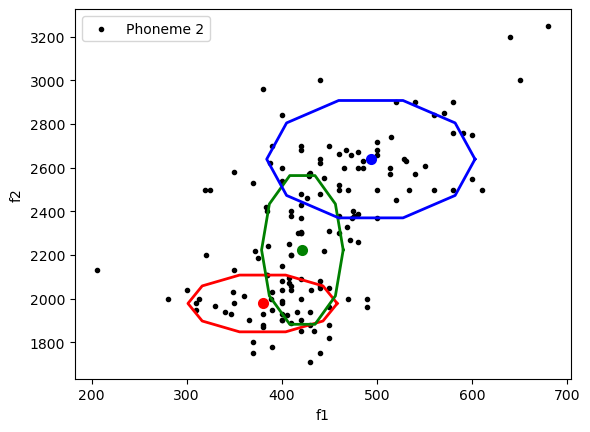

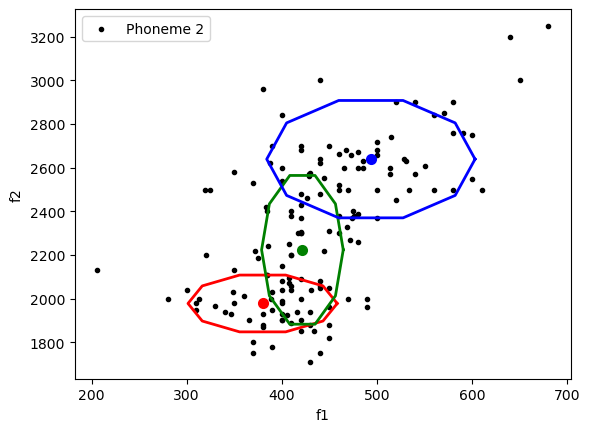

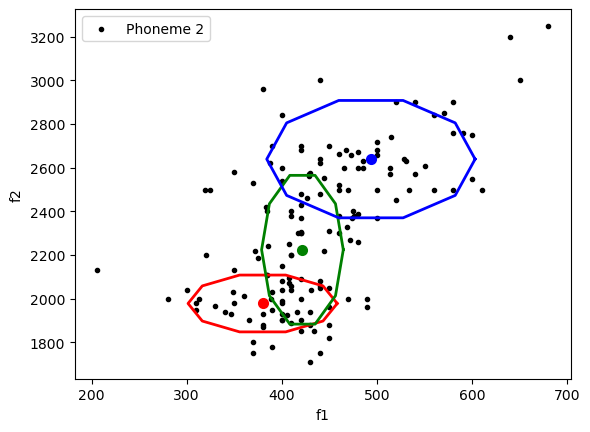

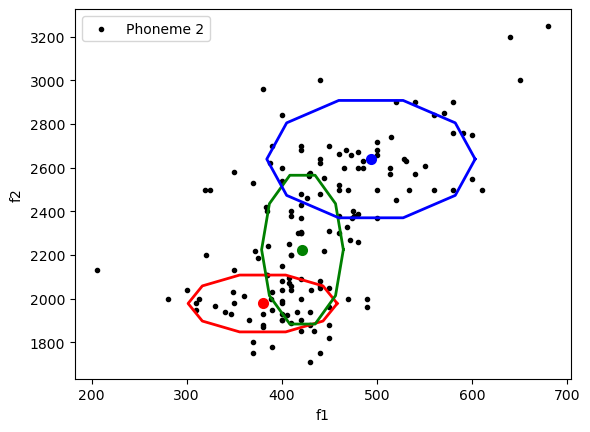

In [174]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

### Q4. Answer

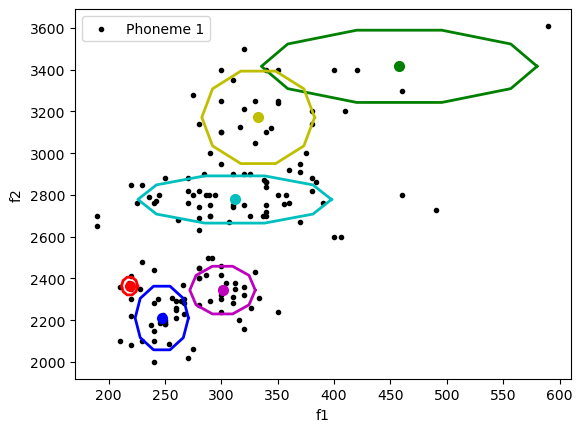


Finished.

[[ 218.63179 2363.589  ]
 [ 457.83557 3416.4324 ]
 [ 247.18053 2210.3777 ]
 [ 311.85788 2778.3462 ]
 [ 301.0685  2344.1323 ]
 [ 332.71625 3171.8914 ]] [[[2.55163232e+01 0.00000000e+00]
  [0.00000000e+00 9.94574606e+02]]

 [[7.47437151e+03 0.00000000e+00]
  [0.00000000e+00 1.65578547e+04]]

 [[2.79055710e+02 0.00000000e+00]
  [0.00000000e+00 1.28398115e+04]]

 [[3.68392035e+03 0.00000000e+00]
  [0.00000000e+00 7.07268283e+03]]

 [[4.21650946e+02 0.00000000e+00]
  [0.00000000e+00 7.20937730e+03]]

 [[1.25191415e+03 0.00000000e+00]
  [0.00000000e+00 2.71209351e+04]]]


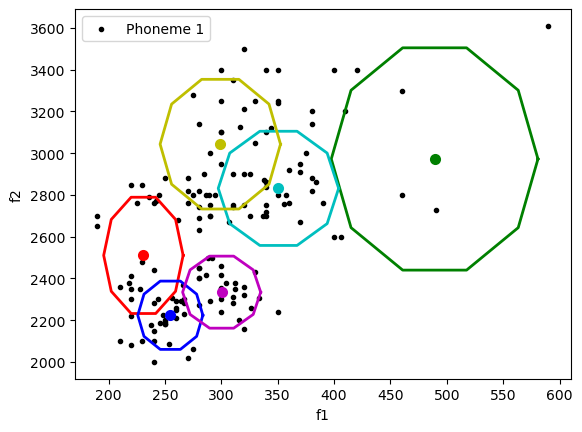

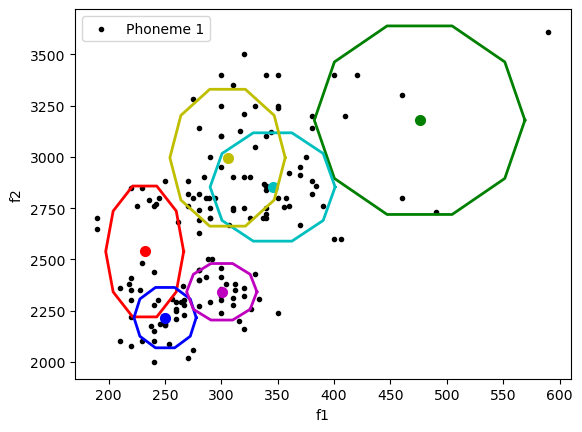

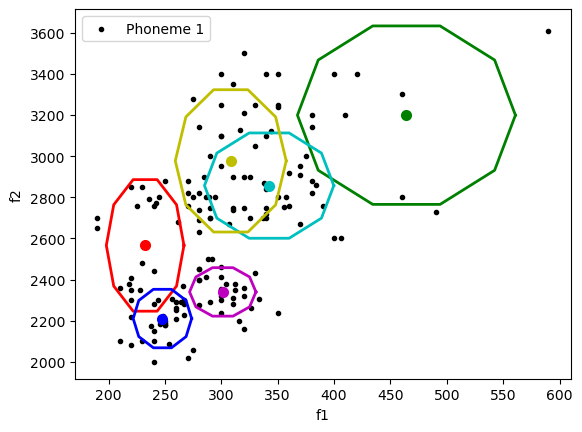

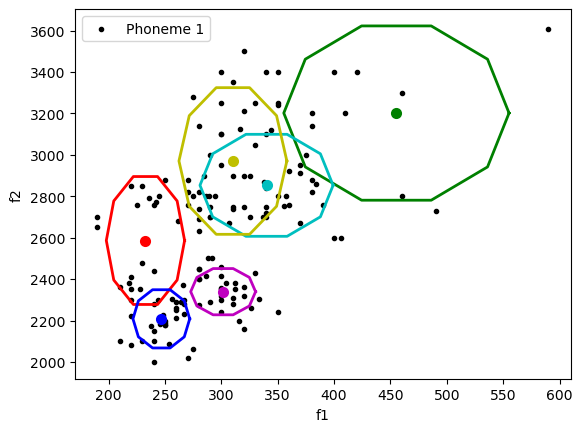

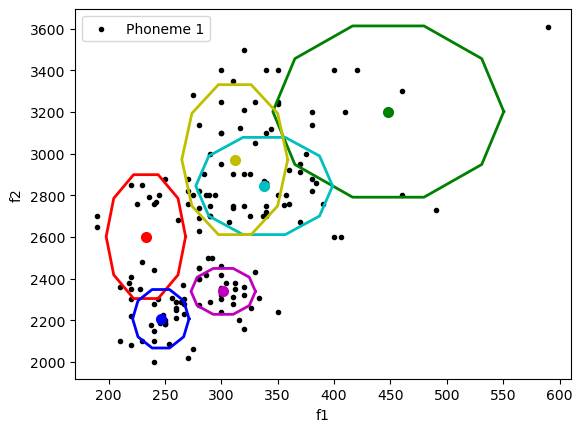

...

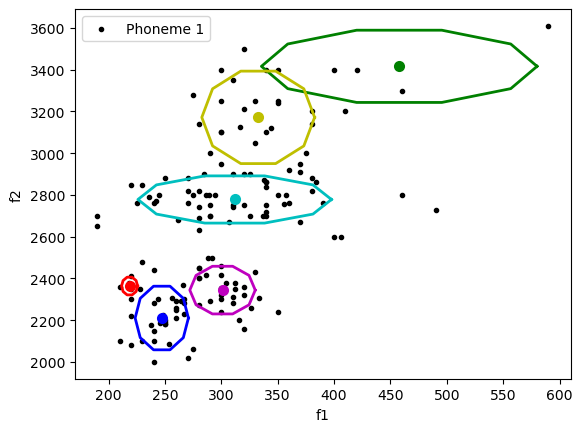

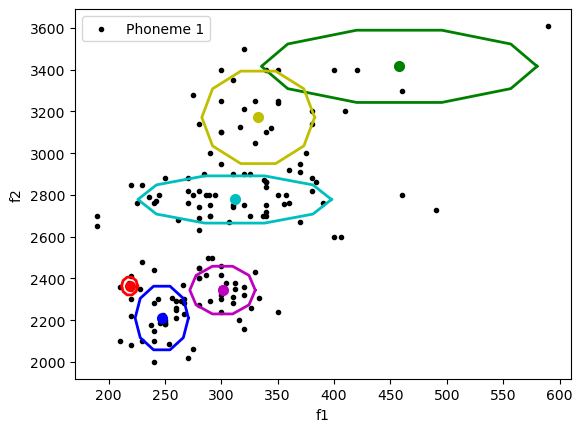

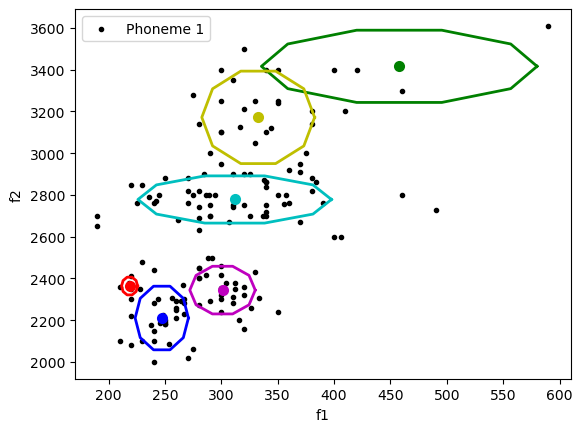

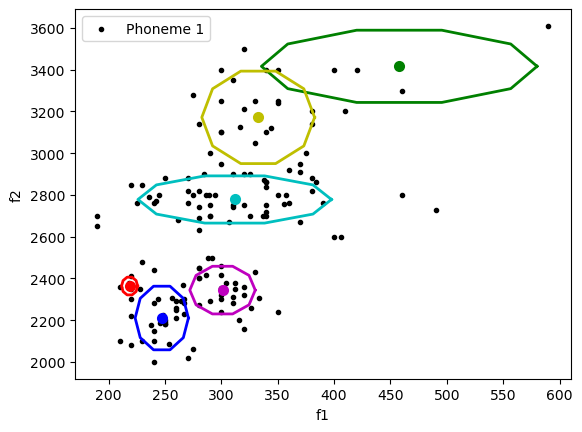

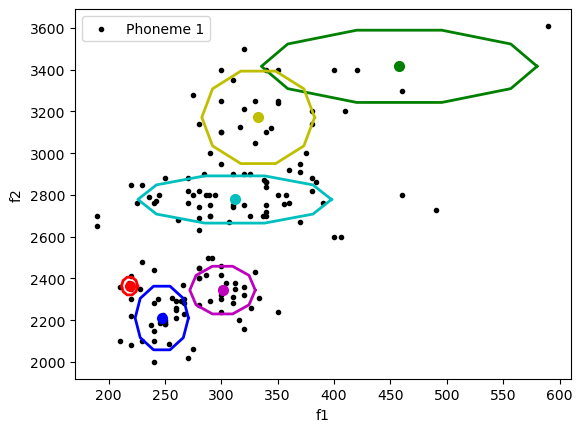

In [175]:
k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

### K = 6 and phoneme_id=2

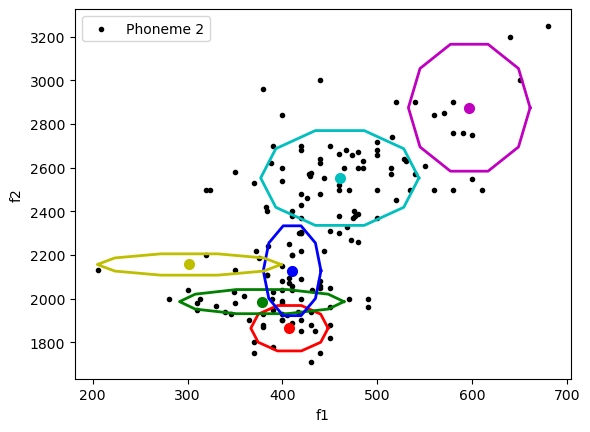


Finished.

[[ 407.4068  1864.4733 ]
 [ 378.19855 1986.3414 ]
 [ 410.21002 2127.9001 ]
 [ 460.40244 2553.0132 ]
 [ 596.8001  2875.0957 ]
 [ 301.83997 2156.5203 ]] [[[  828.17133555     0.        ]
  [    0.          5983.41514762]]

 [[ 3750.78394926     0.        ]
  [    0.          1691.17140005]]

 [[  461.11005323     0.        ]
  [    0.         23437.95039215]]

 [[ 3471.61769311     0.        ]
  [    0.         26097.27629421]]

 [[ 2055.11561385     0.        ]
  [    0.         46769.63482489]]

 [[ 4688.65302459     0.        ]
  [    0.          1317.92339026]]]


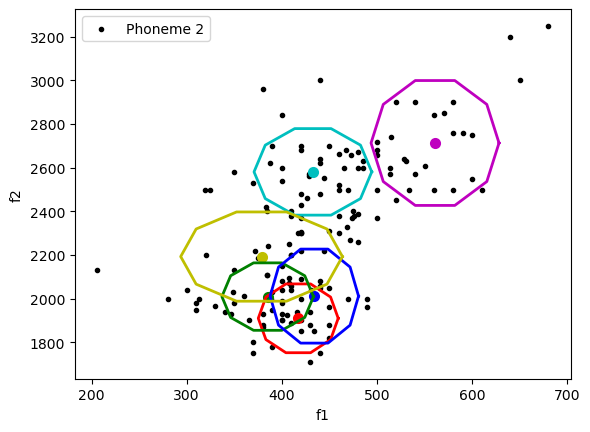

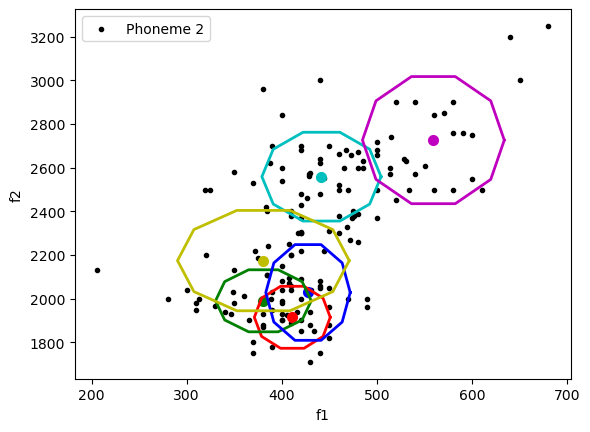

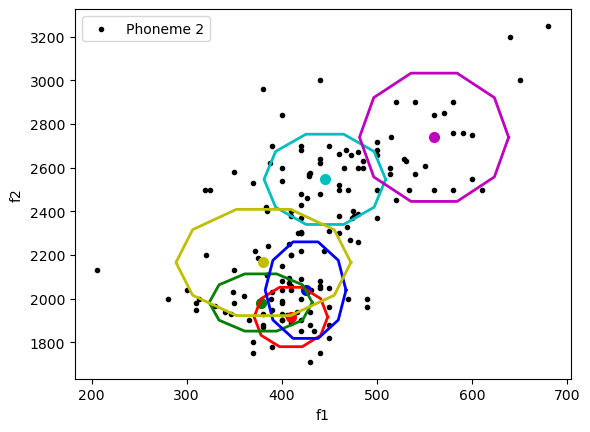

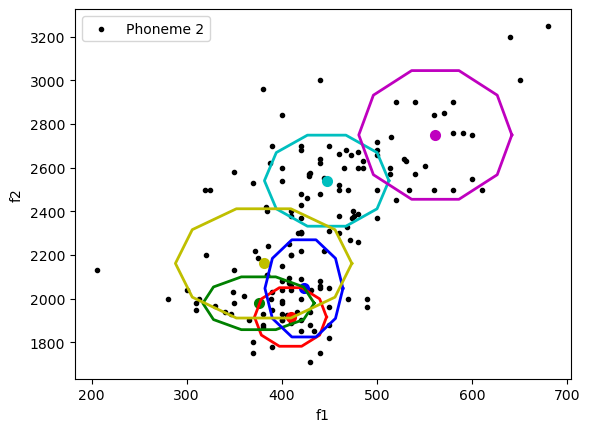

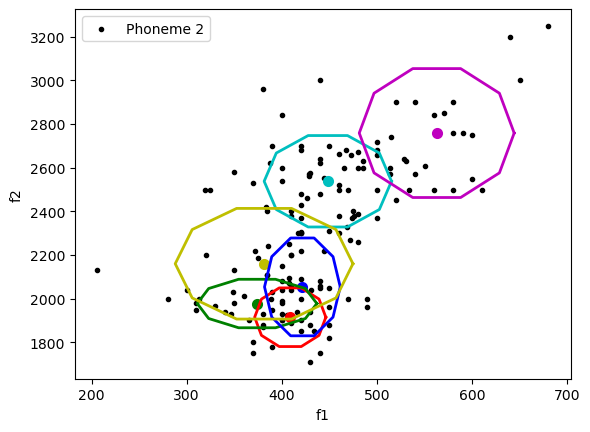

...

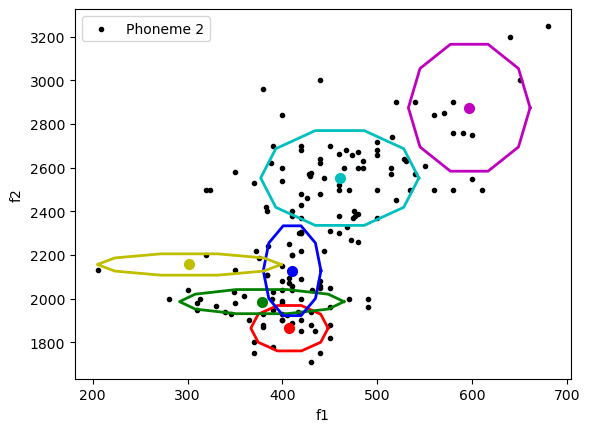

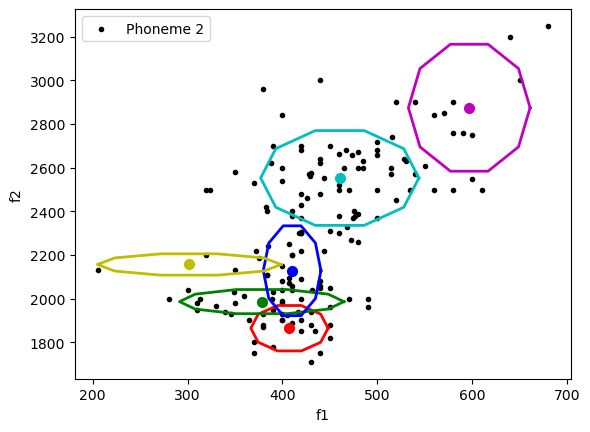

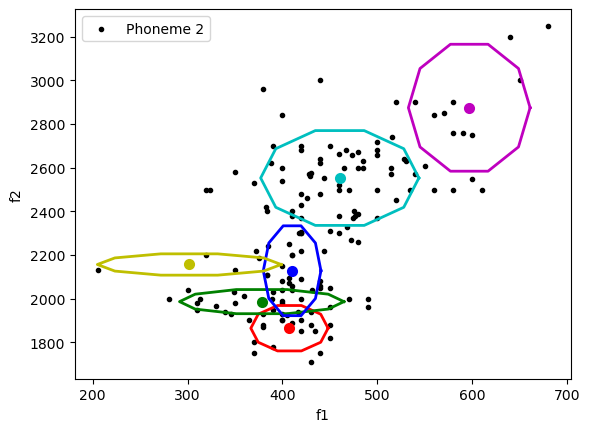

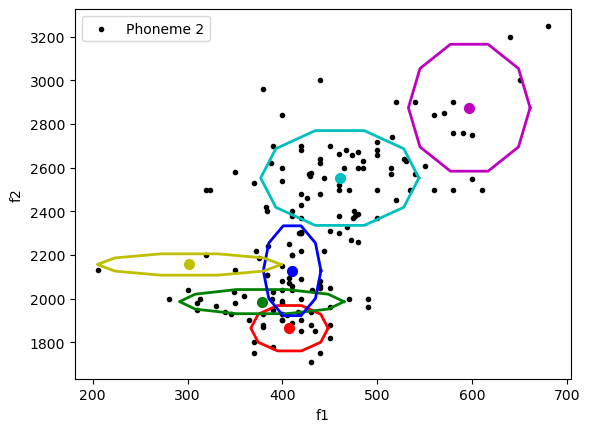

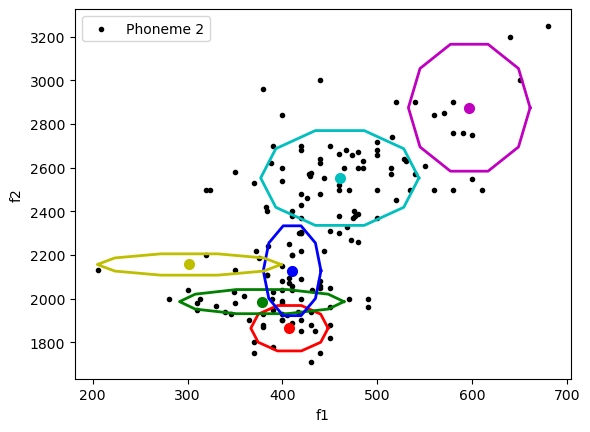

In [176]:
k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2 ## Changed from 1 -> 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)


Classify using the Maximum Likelihood (ML) criterion and calculate the miss-classification error. Remember that a classification under the ML compares $p(\mathbf{x};\boldsymbol\theta_{1})$, where $\boldsymbol\theta_{1}$ are the parameters of the MoG learnt for the first phoneme, with $p(\mathbf{x};\boldsymbol\theta_{2})$, where $\boldsymbol\theta_{2}$  are the parameters of the MoG learnt for the second phoneme.

In [177]:
#Printing first 5 samples
print("X_full first 5 samples: ", X_full[0:5])

X_full first 5 samples:  [[ 240. 2280.]
 [ 280. 2400.]
 [ 390. 2030.]
 [ 310. 1980.]
 [ 490. 1870.]]


In [178]:
#Print first 5 samples from phoneme_id 1 and first 5 samples from phoneme_id as 2
print("X_full[phoneme_id==1,:] first 5 samples: ", X_full[phoneme_id==1,:][0:5])
print("X_full[phoneme_id==2,:] first 5 samples: ", X_full[phoneme_id==2,:][0:5])

X_full[phoneme_id==1,:] first 5 samples:  [[ 240. 2280.]
 [ 280. 2400.]
 [ 220. 2220.]
 [ 210. 2360.]
 [ 250. 2180.]]
X_full[phoneme_id==2,:] first 5 samples:  [[ 390. 2030.]
 [ 310. 1980.]
 [ 410. 1890.]
 [ 420. 1850.]
 [ 400. 1930.]]


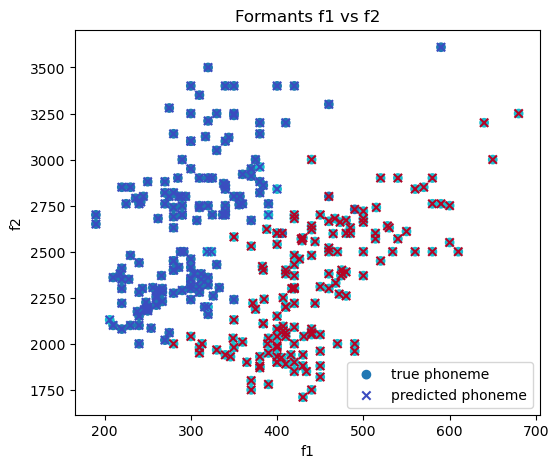

X:  [[ 240. 2280.]
 [ 280. 2400.]
 [ 220. 2220.]
 [ 210. 2360.]
 [ 250. 2180.]]
inds_1:  [ 0  1 20 21 40]
inds_2:  [ 2  3 22 23 42]
inds_1_and_2:  [ 0  1 20 21 40]
Z_phoneme_1:  [[6.30105724e-14 1.13581957e-05 3.49634243e-13]
 [6.98020888e-12 1.01168157e-05 6.62209900e-10]
 [4.25995852e-15 5.02927749e-06 3.35377695e-15]
 [3.39860690e-13 3.04777678e-06 2.12804767e-11]
 [2.27306509e-15 9.49452363e-06 3.05299308e-16]]
Z_phoneme_2:  [[2.51013544e-09 1.22633756e-13 3.66431188e-09]
 [1.16325178e-10 1.09065295e-10 4.27695142e-08]
 [5.39480793e-09 1.97357186e-15 8.47858190e-10]
 [2.99560195e-11 1.82359811e-16 1.81143867e-09]
 [5.71760433e-08 8.38571094e-13 1.99182200e-09]]
Accuracy:  0.9638157894736842
Miscalculation error:  0.03618421052631582


In [179]:
import pandas as pd
from scipy.stats import multivariate_normal


k = 3
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
Z_phoneme_1 = get_predictions(mu, s, p, X)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
###your code here
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu_2 = GMM_parameters_phoneme_2['mu']
s_2 = GMM_parameters_phoneme_2['s']
p_2 = GMM_parameters_phoneme_2['p']

# Initialize array Z_phoneme_2 that will get the predictions of each Gaussian on each sample
Z_phoneme_2 = np.zeros((N,k)) # shape Nxk

# get predictions
Z_phoneme_2 = get_predictions(mu_2, s_2, p_2, X)

# classify each point using Maximum Likelihood
predicted_phoneme = np.zeros((N,1))
# for each sample, check which phoneme has the highest probability
for i in range(N):
    # if the probability of phoneme 1 is higher than the probability of phoneme 2, then classify as phoneme 1
    if np.sum(Z_phoneme_1[i,:]) > np.sum(Z_phoneme_2[i,:]):
        predicted_phoneme[i] = 1
    else:
        predicted_phoneme[i] = 2

true_phoneme = np.zeros((N,1))
true_phoneme[0:len(inds_1)] = 1
true_phoneme[len(inds_1):] = 2

# plot predicted vs true phoneme for F1 and F2 with different colors and markers
plt.figure(figsize=(6,5))
plt.scatter(X[:,0], X[:,1], c=true_phoneme, cmap='tab10', marker='o', label='true phoneme')
plt.scatter(X[:,0], X[:,1], c=predicted_phoneme, cmap='coolwarm', marker='x', label='predicted phoneme')
plt.xlabel('f1')
plt.ylabel('f2')
plt.legend()
plt.title('Formants f1 vs f2')
plt.show()



### your code here
# 5 sample data points

print("X: ", X[0:5])
print("inds_1: ", inds_1[0:5])
print("inds_2: ", inds_2[0:5])
print("inds_1_and_2: ", inds_1_and_2[0:5])

print("Z_phoneme_1: ", Z_phoneme_1[0:5])
print("Z_phoneme_2: ", Z_phoneme_2[0:5])


# calculate accuracy
### your code here
# Calculate accuracy
accuracy = np.sum(predicted_phoneme == true_phoneme)/N
print("Accuracy: ", accuracy)
# Miscalculation error
miscalculation_error = 1 - accuracy
print("Miscalculation error: ", miscalculation_error)

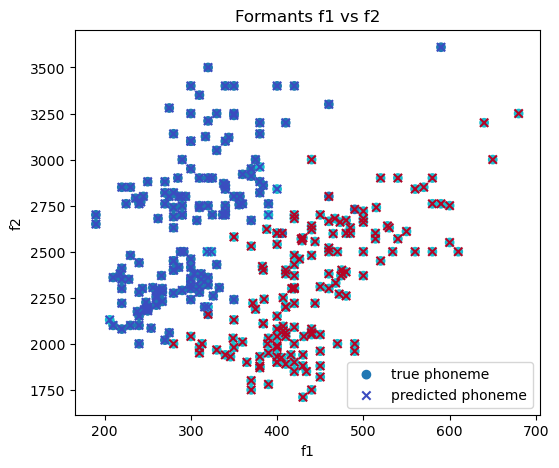

X:  [[ 240. 2280.]
 [ 280. 2400.]
 [ 220. 2220.]
 [ 210. 2360.]
 [ 250. 2180.]]
inds_1:  [ 0  1 20 21 40]
inds_2:  [ 2  3 22 23 42]
inds_1_and_2:  [ 0  1 20 21 40]
Z_phoneme_1:  [[1.23732116e-10 1.80305135e-25 1.25731618e-05 1.34980826e-13
  1.68121992e-07 6.48638039e-14]
 [1.46094497e-37 1.27013877e-21 5.96052124e-07 4.02515297e-10
  8.86126512e-06 2.62772849e-11]
 [9.68873149e-10 1.43082907e-27 4.41666609e-06 9.78811697e-16
  2.63876223e-09 1.63530654e-15]
 [7.35939909e-06 1.41515000e-23 5.85097184e-07 1.18753109e-11
  9.80480276e-10 6.05772684e-14]
 [5.90465719e-21 1.85264540e-28 1.58398356e-05 6.95021901e-17
  1.30492812e-07 4.05526412e-15]]
Z_phoneme_2:  [[1.99742280e-19 5.87646714e-18 1.41653533e-19 1.63126487e-09
  8.90927149e-22 2.75285547e-09]
 [1.78100001e-20 2.61920404e-28 2.18071978e-14 4.37226795e-08
  2.47201662e-18 2.18457831e-16]
 [1.31456955e-19 3.07887379e-14 7.80502487e-23 2.15531513e-10
  1.12538205e-23 1.42875122e-07]
 [6.10598069e-25 2.41131163e-25 4.29821580e-25 

In [180]:
import pandas as pd
from scipy.stats import multivariate_normal


k = 6
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
# Get predictions for phoneme 1
# for i in range(k):
#     Z_phoneme_1[:,i] = p[i]*multivariate_normal.pdf(X, mean=mu[i,:], cov=s[i,:,:])
Z_phoneme_1 = get_predictions(mu, s, p, X)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
###your code here
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu_2 = GMM_parameters_phoneme_2['mu']
s_2 = GMM_parameters_phoneme_2['s']
p_2 = GMM_parameters_phoneme_2['p']

# Initialize array Z_phoneme_2 that will get the predictions of each Gaussian on each sample
Z_phoneme_2 = np.zeros((N,k)) # shape Nxk

# get predictions
# Z_phoneme_2 = np.zeros((N,k))
# for i in range(k):
#     Z_phoneme_2[:,i] = p[i]*multivariate_normal.pdf(X, mean=mu[i,:], cov=s[i,:,:])
Z_phoneme_2 = get_predictions(mu_2, s_2, p_2, X)

# classify each point using Maximum Likelihood
predicted_phoneme = np.zeros((N,1))
# for each sample, check which phoneme has the highest probability
for i in range(N):
    # if the probability of phoneme 1 is higher than the probability of phoneme 2, then classify as phoneme 1
    if np.sum(Z_phoneme_1[i,:]) > np.sum(Z_phoneme_2[i,:]):
        predicted_phoneme[i] = 1
    else:
        predicted_phoneme[i] = 2

true_phoneme = np.zeros((N,1))
true_phoneme[0:len(inds_1)] = 1
true_phoneme[len(inds_1):] = 2

# plot predicted vs true phoneme for F1 and F2 with different colors and markers
plt.figure(figsize=(6,5))
plt.scatter(X[:,0], X[:,1], c=true_phoneme, cmap='tab10', marker='o', label='true phoneme')
plt.scatter(X[:,0], X[:,1], c=predicted_phoneme, cmap='coolwarm', marker='x', label='predicted phoneme')
plt.xlabel('f1')
plt.ylabel('f2')
plt.legend()
plt.title('Formants f1 vs f2')
plt.show()

### your code here
# 5 sample data points

print("X: ", X[0:5])
print("inds_1: ", inds_1[0:5])
print("inds_2: ", inds_2[0:5])
print("inds_1_and_2: ", inds_1_and_2[0:5])

print("Z_phoneme_1: ", Z_phoneme_1[0:5])
print("Z_phoneme_2: ", Z_phoneme_2[0:5])


# calculate accuracy
### your code here
# Calculate accuracy
accuracy = np.sum(predicted_phoneme == true_phoneme)/N
print("Accuracy: ", accuracy)

# Miscalculation error
miscalculation_error = 1 - accuracy
print("Miscalculation error: ", miscalculation_error)



In particular,
create a custom uniform grid of points that spans all possible intermediate combinations of $F1$ and $F2$ features, using the features' minimum and maximum values as the limits. (Hint: check documentation for [np.meshgrid](https://numpy.org/doc/stable/reference/generated/numpy.meshgrid.html) and [np.linspace](https://numpy.org/doc/stable/reference/generated/numpy.linspace.html) ). Classify each point in the grid using one of your classifiers. That is, create a classification matrix, $\mathbf{M}$, whose elements are either 0 or 1. $M(i,j)$ is 0 if the point at location $(i,j)$ on the custom grid is classified as belonging to phoneme 1, and is 1 otherwise.

### Hint: building the custom grid:
Assuming our data were the orange points below, the custom grid would look something like the following (evenly spaced points spanning the minimum to maximum values of both features):

![](https://i.imgur.com/khfYx42.png)



**When K = 3**

f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points
********************* Custom Grid *********************
Sample of grid_points:  [[ 190.         1710.        ]
 [ 190.         1711.00052659]
 [ 190.         1712.00105319]
 [ 190.         1713.00157978]
 [ 190.         1714.00210637]
 [ 190.         1715.00263296]
 [ 190.         1716.00315956]
 [ 190.         1717.00368615]
 [ 190.         1718.00421274]
 [ 190.         1719.00473934]]
Last 10 samples of grid_points:  [[ 680.         3600.99526066]
 [ 680.         3601.99578726]
 [ 680.         3602.99631385]
 [ 680.         3603.99684044]
 [ 680.         3604.99736704]
 [ 680.         3605.99789363]
 [ 680.         3606.99842022]
 [ 680.         3607.99894681]
 [ 680.         3608.99947341]
 [ 680.         3610.        ]]
grid_points.shape:  (931000, 2)
Sample of f1_grid:  [[190.         190.         190.         ... 190.         190.
  190.        ]
 [191.00204499 191.00204499 191.00204499 ... 191.00204499 191.0020449

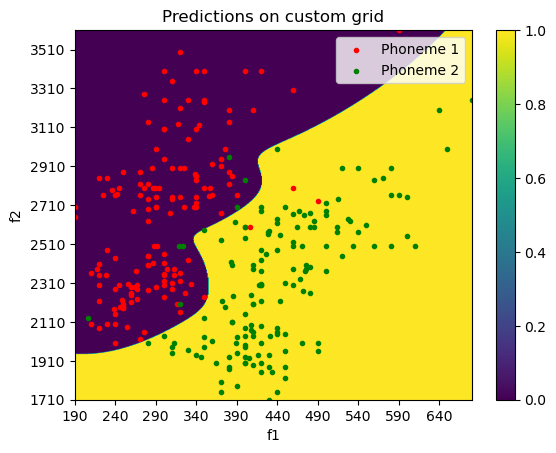

In [181]:
k = 3
X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
grid_points, f1_grid, f2_grid, f1_grid.shape = create_custom_grid(min_f1, max_f1, min_f2, max_f2, N_f1, N_f2)

# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Classify each point on the grid
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
    
mu_k3_1 = GMM_parameters_phoneme_1['mu']
s_k3_1 = GMM_parameters_phoneme_1['s']
p_k3_1 = GMM_parameters_phoneme_1['p']

p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu_k3_2 = GMM_parameters_phoneme_2['mu']
s_k3_2 = GMM_parameters_phoneme_2['s']
p_k3_2 = GMM_parameters_phoneme_2['p']


# Do predictions, using GMM trained on phoneme 1, on custom grid
Z_phoneme_1_k3 = get_predictions(mu_k3_1, s_k3_1, p_k3_1, grid_points)
print("Sample of Z_phoneme_1_k3: ", Z_phoneme_1_k3[0:3])

# Do predictions, using GMM trained on phoneme 2, on custom grid
Z_phoneme_2_k3 = get_predictions(mu_k3_2, s_k3_2, p_k3_2, grid_points)
print("Sample of Z_phoneme_2_k3: ", Z_phoneme_2_k3[0:3])

# Compare these predictions, to classify each point of the grid
# Classification matrix M, initialized to zeros
M = np.zeros((N_f1, N_f2))

# Compare predictions and classify each grid point
# The grid points predicted to belong to phoneme 1 will be 0, otherwise 1
for i in range(N_f1):
    for j in range(N_f2):
        idx = i * N_f2 + j
        if Z_phoneme_1_k3[idx].sum() > Z_phoneme_2_k3[idx].sum():
            M[i, j] = 0
        else:
            M[i, j] = 1

# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
M = M.T
print("M.shape: ", M.shape)

# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
print("M: ", M[0:5, :])


#########################################
################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

**When K = 6**

Sample of Z_phoneme_1_k6:  [[1.82224115e-105 1.99260815e-047 2.77266136e-012 1.38609276e-041
  6.38302509e-024 1.06671062e-026]
 [3.51508733e-105 2.20897197e-047 2.88279403e-012 1.61211997e-041
  6.96974336e-024 1.12579826e-026]
 [6.77375161e-105 2.44868122e-047 2.99706760e-012 1.87473960e-041
  7.60933525e-024 1.18811504e-026]]
Sample of Z_phoneme_2_k6:  [[4.52629426e-19 1.23511972e-17 3.58651225e-30 2.42364898e-16
  1.80883269e-30 4.99994103e-40]
 [4.64434528e-19 1.45406105e-17 3.65098980e-30 2.50321224e-16
  1.85446362e-30 7.01485947e-40]
 [4.76467798e-19 1.71079966e-17 3.71646778e-30 2.58528823e-16
  1.90120498e-30 9.83429408e-40]]
M.shape:  (1900, 490)
M:  [[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


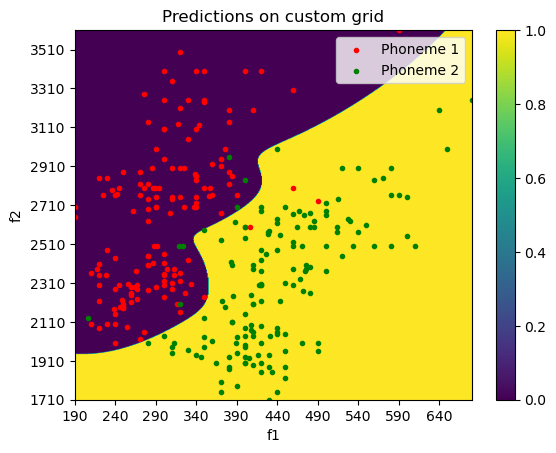

In [182]:
k = 6
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))

mu_k6_1 = GMM_parameters_phoneme_1['mu']
s_k6_1 = GMM_parameters_phoneme_1['s']
p_k6_1 = GMM_parameters_phoneme_1['p']

p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise('File {} does not exist.'.format(npy_filename))

mu_k6_2 = GMM_parameters_phoneme_2['mu']
s_k6_2 = GMM_parameters_phoneme_2['s']
p_k6_2 = GMM_parameters_phoneme_2['p']

# Do predictions, using GMM trained on phoneme 1, on custom grid
Z_phoneme_1_k6 = get_predictions(mu_k6_1, s_k6_1, p_k6_1, grid_points)
print("Sample of Z_phoneme_1_k6: ", Z_phoneme_1_k6[0:3])

# Do predictions, using GMM trained on phoneme 2, on custom grid
Z_phoneme_2_k6 = get_predictions(mu_k6_2, s_k6_2, p_k6_2, grid_points)
print("Sample of Z_phoneme_2_k6: ", Z_phoneme_2_k6[0:3])

# Compare these predictions, to classify each point of the grid
# Classification matrix M, initialized to zeros
M = np.zeros((N_f1, N_f2))

# Compare predictions and classify each grid point
# The grid points predicted to belong to phoneme 1 will be 0, otherwise 1
for i in range(N_f1):
    for j in range(N_f2):
        idx = i * N_f2 + j
        if Z_phoneme_1_k3[idx].sum() > Z_phoneme_2_k3[idx].sum():
            M[i, j] = 0
        else:
            M[i, j] = 1

# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
M = M.T
print("M.shape: ", M.shape)

# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
print("M: ", M[0:5, :])

#########################################

################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

Create a new dataset that will contain 3 columns, as follows:
\begin{equation}
    X = [F1, F2, F1+F2]
\end{equation}

 Trying to fit a MoG model to the new data. 

Iteration 001/150
Iteration 002/150


/tmp/ipykernel_1587/1427147708.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))# Calculate the probability density function (PDF) for each sample and component.


ValueError: Input contains infinity or a value too large for dtype('float64').

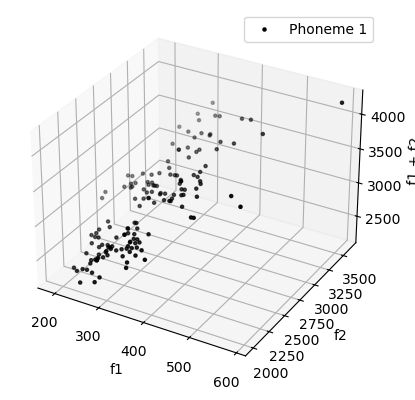

In [183]:
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X
# Filter X to, contain only samples that belong to the chosen phoneme.

X[:,0] = f1.copy()
X[:,1] = f2.copy()
X[:,2] = X[:,0]+X[:,1]
X = X.astype(np.float64)

X = X[phoneme_id==p_id,:]

#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()

### <font color="maroon"> Q9. Suggest ways of overcoming the singularity problem and implement one of them. Show any training outputs in the report and discuss. [3 marks] </font>

In [ ]:
#########################################
# Write your code here
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X
# Filter X to, contain only samples that belong to the chosen phoneme.

X[:,0] = f1.copy()
X[:,1] = f2.copy()
X[:,2] = X[:,0]+X[:,1]
X = X.astype(np.float64)

X = X[phoneme_id==p_id,:]

#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = (np.matmul(term_1, term_2)/np.sum(Z[:,i]))
        p[i] = np.mean(Z[:,i])

        ## Mitigating Singularity problem by adding a very small value epsilon at the diagonal positions of covariance matrix
        s[i,:,:] = s[i,:,:] + 1e-4 * np.identity(s[i,:,:].shape[-1])


plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()
print('Implemented GMM | Mean values')
for i in range(k):
    print(mu[i])
print('Implemented GMM | Covariances')
for i in range(k):
    print(s[i,:,:])
print('Implemented GMM | Weights')
print(p)
print('')
